<a href="https://colab.research.google.com/github/Dice128/2025_PBO_TI1B/blob/main/Praktikum%20Object%20Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum Implementasi R-CNN, FastR-CNN, dan Faster R-CNN

## Setup Dependencies

In [1]:
import torch
print(f"CUDA Available: {torch.cuda.is_available()}")
print(f"CUDA Device: {torch.cuda.get_device_name(0) if
torch.cuda.is_available() else 'No GPU'}")

CUDA Available: True
CUDA Device: Tesla T4


In [3]:
# Install PyTorch dan torchvision
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
# Install library pendukung
!pip install opencv-python matplotlib pillow numpy
!pip install pycocotools  # Untuk evaluasi dengan COCO metrics
# Install library untuk selective search (R-CNN dan Fast R-CNN)
!pip install selectivesearch
# Verify installation
import torch
import torchvision
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
print(f"PyTorch Version: {torch.__version__}")
print(f"Torchvision Version: {torchvision.__version__}")
print(f"OpenCV Version: {cv2.__version__}")

Looking in indexes: https://download.pytorch.org/whl/cu118
  Preparing metadata (setup.py) ... done
  Created wheel for selectivesearch: filename=selectivesearch-0.4-py3-none-any.whl size=4336 sha256=363cf6154b3df9b3e367108de00c8674e831d387980c599514aa59bc01aadf94
  Stored in directory: /root/.cache/pip/wheels/7f/9b/c7/58b71f1e9fe4aa0ef8affd1c673f8818bc22a5091ea8cbbe93
Successfully built selectivesearch
PyTorch Version: 2.8.0+cu126
Torchvision Version: 0.23.0+cu126
OpenCV Version: 4.12.0


In [4]:
# Download dan extract dataset
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
!unzip -q PennFudanPed.zip
!ls PennFudanPed/

--2025-11-21 01:06:59--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M  10.6MB/s    in 5.8s    

2025-11-21 01:07:06 (8.84 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]

added-object-list.txt  Annotation  PedMasks  PNGImages	readme.txt


In [5]:
import torch
import torchvision
from torchvision import transforms
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import time
# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## Praktikum 1: Implementasi R-CNN
### Langkah 1.1: Implementasi Selective Search

/usr/local/lib/python3.12/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Generated 342 region proposals


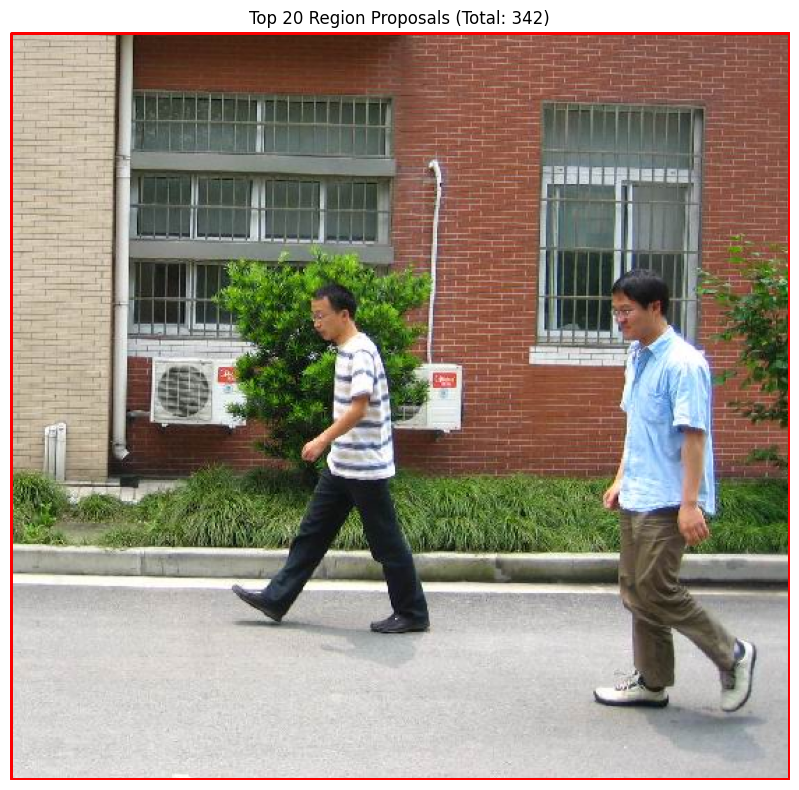

In [7]:
import selectivesearch
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def generate_region_proposals(image_path, scale=500, sigma=0.9, min_size=10):
    """
    Generate region proposals using Selective Search
    Args:
        image_path: Path to input image
        scale: Larger scale -> fewer regions
        sigma: Width of Gaussian kernel for preprocessing
        min_size: Minimum component size
    Returns:
        regions: List of proposed regions with coordinates
    """
    # Load image
    img = cv2.imread(image_path)

    # Cek jika gambar gagal dimuat
    if img is None:
        raise ValueError(f"Gambar tidak ditemukan di path: {image_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Run selective search
    img_lbl, regions = selectivesearch.selective_search(
        img_rgb, scale=scale, sigma=sigma, min_size=min_size
    )

    # Extract bounding boxes
    candidates = []
    for r in regions:
        # Exclude regions with size < 2000 pixels
        if r['size'] < 2000:
            continue

        # Get bounding box
        x, y, w, h = r['rect']

        # Exclude small regions (width or height is too small)
        if w < 20 or h < 20:
            continue

        candidates.append({
            'rect': (x, y, w, h),
            'size': r['size']
        })

    # Sort by size and take top 2000
    candidates = sorted(candidates, key=lambda x: x['size'], reverse=True)[:2000]

    return candidates, img_rgb

# --- Bagian Utama (Main Execution) ---

# Ganti path ini dengan path gambar yang Anda miliki di komputer
image_path = 'PennFudanPed/PNGImages/FudanPed00001.png'

try:
    # Test selective search
    proposals, img = generate_region_proposals(image_path)
    print(f"Generated {len(proposals)} region proposals")

    # Visualize some proposals
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    for i, prop in enumerate(proposals[:20]):  # Show first 20 proposals
        x, y, w, h = prop['rect']
        rect = patches.Rectangle(
            (x, y), w, h,
            linewidth=1,
            edgecolor='r',
            facecolor='none'
        )
        ax.add_patch(rect)

    ax.set_title(f'Top 20 Region Proposals (Total: {len(proposals)})')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('rcnn_proposals.png', dpi=150, bbox_inches='tight')
    plt.show()

except Exception as e:
    print(f"Terjadi Error: {e}")
    print("Pastikan file gambar benar-benar ada di path yang ditulis.")

### Langkah 1.2: Feature Extraction dengan Pre-trained CNN

In [12]:
import torch
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import numpy as np

class RCNNFeatureExtractor:
    """
    Feature extractor for R-CNN using pre-trained ResNet50
    """
    def __init__(self, device=None):
        # Otomatis pilih device (CUDA jika ada, jika tidak CPU)
        if device is None:
            self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        else:
            self.device = device

        print(f"Using device: {self.device}")

        # Load pre-trained ResNet50
        weights = ResNet50_Weights.IMAGENET1K_V1
        self.model = resnet50(weights=weights)

        # Remove final classification layer (Fully Connected)
        # Kita hanya butuh fitur (vektor), bukan prediksi kelas imagenet
        self.model = nn.Sequential(*list(self.model.children())[:-1])
        self.model.to(self.device)
        self.model.eval() # Set model ke mode evaluasi (bukan training)

        # Define transforms (preprocessing standar ResNet)
        self.transform = weights.transforms()

    def extract_features(self, image, regions):
        """
        Extract features from regions

        Args:
            image: PIL Image or numpy array
            regions: List of region proposals

        Returns:
            features: Tensor of shape [N, 2048] where N is number of regions
            valid_regions: List of valid regions (some may be filtered)
        """
        # Konversi numpy array (dari OpenCV) ke PIL Image jika perlu
        if isinstance(image, np.ndarray):
            image = Image.fromarray(image)

        features_list = []
        valid_regions = []

        with torch.no_grad(): # Matikan gradien untuk hemat memori
            for region in regions:
                x, y, w, h = region['rect']

                # Crop region dari gambar asli
                try:
                    region_img = image.crop((x, y, x+w, y+h))

                    # Transform dan tambah batch dimension [1, C, H, W]
                    # Perbaikan: Baris ini sebelumnya terpotong di input Anda
                    region_tensor = self.transform(region_img).unsqueeze(0).to(self.device)

                    # Extract features
                    features = self.model(region_tensor)
                    features = features.squeeze() # Hapus dimensi 1x1 di akhir -> jadi [2048]

                    features_list.append(features.cpu())
                    valid_regions.append(region)
                except Exception as e:
                    # Skip jika region terlalu kecil atau ada error cropping
                    continue

        if len(features_list) == 0:
            return None, []

        # Gabungkan list tensor menjadi satu tensor besar [N, 2048]
        features = torch.stack(features_list)
        return features, valid_regions

# --- Bagian Test / Eksekusi ---

# Pastikan variabel 'img' dan 'proposals' sudah ada dari kode sebelumnya (Selective Search)
# Jika kode ini dijalankan terpisah, pastikan Anda memuat 'img' dan membuat dummy 'proposals' dulu.

try:
    # Inisialisasi Extractor
    extractor = RCNNFeatureExtractor() # Device otomatis terdeteksi

    # Cek apakah variabel img dan proposals ada (dari kode sebelumnya)
    if 'img' in locals() and 'proposals' in locals():
        print("Mengekstrak fitur dari proposal region...")

        # Ambil 100 proposal pertama saja untuk tes biar cepat
        features, valid_regions = extractor.extract_features(img, proposals[:100])

        if features is not None:
            print(f"Extracted features shape: {features.shape}")
            # Output harusnya: torch.Size([Jumlah_Valid, 2048])
            print(f"Valid regions: {len(valid_regions)}")
        else:
            print("Tidak ada fitur yang berhasil diekstrak.")
    else:
        print("PERINGATAN: Variabel 'img' atau 'proposals' belum didefinisikan.")
        print("Jalankan kode Selective Search (sebelumnya) terlebih dahulu.")

except NameError as e:
    print(f"Error: {e}")
except Exception as e:
    print(f"Terjadi kesalahan: {e}")

Using device: cuda
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 223MB/s]


Mengekstrak fitur dari proposal region...
Extracted features shape: torch.Size([100, 2048])
Valid regions: 100


### Langkah 1.3: Classification dengan SVM

In [13]:
import numpy as np
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler

class RCNNClassifier:
    """
    SVM classifier for R-CNN
    """
    def __init__(self, num_classes=2):
        self.num_classes = num_classes
        self.scaler = StandardScaler()
        # Linear SVM sering digunakan pada R-CNN klasik
        # probability=True dibutuhkan agar kita bisa mendapatkan skor keyakinan (confidence score)
        self.svm = SVC(kernel='linear', probability=True, random_state=42)

    def train(self, features, labels):
        """
        Train SVM classifier

        Args:
            features: numpy array of shape [N, feature_dim] (misal: output dari ResNet)
            labels: numpy array of shape [N] (0 untuk background, 1 untuk objek)
        """
        # Normalize features (Penting untuk SVM agar konvergensi lebih cepat)
        features_scaled = self.scaler.fit_transform(features)

        # Train SVM
        self.svm.fit(features_scaled, labels)
        print(f"SVM trained with {len(features)} samples")

    def predict(self, features):
        """
        Predict class labels

        Args:
            features: numpy array of shape [N, feature_dim]

        Returns:
            predictions: class labels
            probabilities: class probabilities
        """
        # Gunakan scaler yang sama dengan saat training (hanya transform, jangan fit lagi)
        features_scaled = self.scaler.transform(features)

        predictions = self.svm.predict(features_scaled)
        probabilities = self.svm.predict_proba(features_scaled)

        return predictions, probabilities

# --- Bagian Test / Demo Sederhana ---

print("--- Demo Training SVM R-CNN (Data Dummy) ---")

# 1. Buat data dummy (pura-pura ini fitur dari ResNet)
# Misal: 100 region, setiap region punya 2048 fitur
N_SAMPLES = 100
FEATURE_DIM = 2048

# Fitur acak
X_dummy = np.random.rand(N_SAMPLES, FEATURE_DIM)
# Label acak (0 atau 1)
y_dummy = np.random.randint(0, 2, N_SAMPLES)

# 2. Inisialisasi Classifier
rcnn_svm = RCNNClassifier(num_classes=2)

try:
    # 3. Lakukan Training
    print("Sedang melatih SVM...")
    rcnn_svm.train(X_dummy, y_dummy)

    # 4. Lakukan Prediksi (Inference) pada data baru
    X_new = np.random.rand(5, FEATURE_DIM) # 5 region baru
    preds, probs = rcnn_svm.predict(X_new)

    print("\nHasil Prediksi (5 sampel):")
    print(f"Kelas Prediksi: {preds}")
    print(f"Probabilitas:\n{probs}")

except Exception as e:
    print(f"Terjadi Error: {e}")

print("\n" + "="*40)
print("Note: Full R-CNN training requires labeled region proposals.")
print("For practical purposes, usually we demonstrate inference using Faster R-CNN")
print("because creating ground-truth labels for regions manually is complex.")
print("="*40)

--- Demo Training SVM R-CNN (Data Dummy) ---
Sedang melatih SVM...
SVM trained with 100 samples

Hasil Prediksi (5 sampel):
Kelas Prediksi: [0 0 1 1 1]
Probabilitas:
[[0.64765011 0.35234989]
 [0.61636019 0.38363981]
 [0.4263199  0.5736801 ]
 [0.44946293 0.55053707]
 [0.4701379  0.5298621 ]]

Note: Full R-CNN training requires labeled region proposals.
For practical purposes, usually we demonstrate inference using Faster R-CNN
because creating ground-truth labels for regions manually is complex.


### Langkah 1.4: Complete R-CNN Pipeline (Simplified)

Step 1: Generating region proposals...


/usr/local/lib/python3.12/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Generated 342 proposals
Step 2: Extracting features from regions...
Using device: cuda
Extracted features from 342 regions
Step 3: Classifying regions (using Faster R-CNN)...
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 209MB/s]


Step 4: Found 2 objects above threshold 0.7


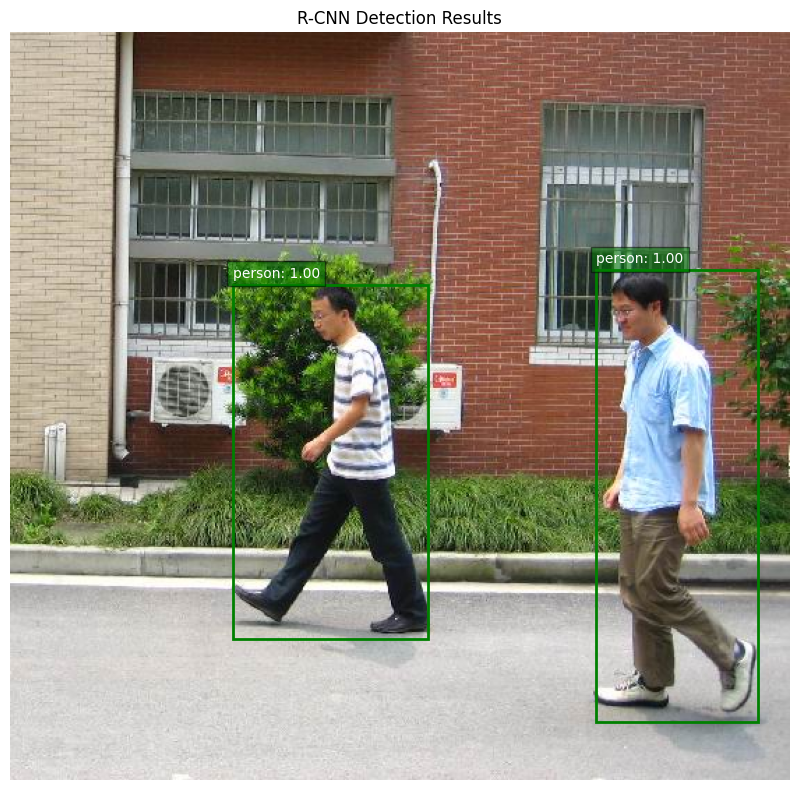


Detection Summary:
Total detections: 2
  1. person: 1.000
  2. person: 1.000


In [14]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# Tentukan device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def rcnn_inference_simplified(image_path, threshold=0.5):
    """
    Simplified R-CNN inference using selective search + pre-trained classifier

    Args:
        image_path: Path to input image
        threshold: Confidence threshold

    Returns:
        detections: List of detected objects with boxes and scores
    """
    # Step 1: Generate region proposals
    # Pastikan fungsi 'generate_region_proposals' dari pertanyaan sebelumnya sudah ada
    print("Step 1: Generating region proposals...")
    try:
        proposals, img = generate_region_proposals(image_path, scale=500)
        print(f"Generated {len(proposals)} proposals")
    except NameError:
        raise NameError("Fungsi 'generate_region_proposals' belum didefinisikan. Jalankan kode sebelumnya.")

    # Step 2: Extract features
    # Pastikan class 'RCNNFeatureExtractor' dari pertanyaan sebelumnya sudah ada
    print("Step 2: Extracting features from regions...")
    try:
        extractor = RCNNFeatureExtractor(device=device)
        # Ambil 500 proposal teratas saja untuk efisiensi demo
        features, valid_regions = extractor.extract_features(img, proposals[:500])

        if valid_regions:
            print(f"Extracted features from {len(valid_regions)} regions")
        else:
            print("Warning: Tidak ada region valid yang diekstrak.")
    except NameError:
        print("Warning: 'RCNNFeatureExtractor' belum didefinisikan (Melewati langkah ini).")

    # Step 3: Classification (using pre-trained Faster R-CNN for demo)
    # Catatan: Untuk demo praktis, kita menggunakan model Faster R-CNN yang sudah jadi
    # karena melatih SVM dari awal butuh dataset berlabel besar.
    print("Step 3: Classifying regions (using Faster R-CNN)...")

    # Load pre-trained Faster R-CNN
    weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn(weights=weights)
    model.to(device)
    model.eval()

    # Convert image to tensor
    transform = transforms.Compose([transforms.ToTensor()])
    img_pil = Image.fromarray(img)
    img_tensor = transform(img_pil).to(device)

    # Get predictions
    with torch.no_grad():
        # Model butuh list of tensors
        predictions = model([img_tensor])

    # Filter predictions
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Apply threshold
    keep = scores > threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    print(f"Step 4: Found {len(boxes)} objects above threshold {threshold}")

    return boxes, labels, scores, img

# --- Eksekusi dan Visualisasi ---

# Path gambar (Ganti dengan gambar Anda)
image_path = 'PennFudanPed/PNGImages/FudanPed00001.png'

try:
    # Run R-CNN inference
    boxes, labels, scores, img = rcnn_inference_simplified(
        image_path,
        threshold=0.7
    )

    # Visualize results
    # Daftar kelas COCO (Standar 91 kelas, ini versi ringkas untuk demo)
    COCO_CLASSES = [
        '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
        'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
        'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant'
    ]

    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    for box, label, score in zip(boxes, labels, scores):
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1

        # Gambar kotak
        rect = patches.Rectangle((x1, y1), w, h, linewidth=2, edgecolor='green', facecolor='none')
        ax.add_patch(rect)

        # Tentukan nama kelas
        if label < len(COCO_CLASSES):
            class_name = COCO_CLASSES[label]
        else:
            class_name = f'class_{label}'

        # Tambahkan teks label
        ax.text(
            x1, y1-5,
            f'{class_name}: {score:.2f}',
            bbox=dict(facecolor='green', alpha=0.5),
            fontsize=10, color='white'
        )

    ax.set_title('R-CNN Detection Results')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('rcnn_results.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\nDetection Summary:")
    print(f"Total detections: {len(boxes)}")

    for i, (label, score) in enumerate(zip(labels, scores)):
        if label < len(COCO_CLASSES):
            class_name = COCO_CLASSES[label]
        else:
            class_name = f'class_{label}'
        print(f"  {i+1}. {class_name}: {score:.3f}")

except FileNotFoundError:
    print(f"Error: File gambar tidak ditemukan di {image_path}")
except Exception as e:
    print(f"Terjadi kesalahan: {e}")

## Praktikum 2: Implementasi Fast R-CNN
### Langkah 2.1: Implementasi RoI Pooling

In [15]:
import torch
import torchvision.ops as ops
import numpy as np

# Tentukan device (GPU jika ada, kalau tidak CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class FastRCNNRoIPooling:
    """
    RoI Pooling implementation for Fast R-CNN
    """
    def __init__(self, output_size=(7, 7), spatial_scale=1.0):
        """
        Args:
            output_size: Fixed output size (height, width) -> Hasil akhir setiap kotak
            spatial_scale: Scale factor from image to feature map (misal 1/16)
        """
        self.output_size = output_size
        self.spatial_scale = spatial_scale

    def forward(self, features, boxes):
        """
        Apply RoI Pooling

        Args:
            features: Feature map tensor [1, C, H, W]
            boxes: Region proposals [N, 4] in format [x1, y1, x2, y2]

        Returns:
            pooled_features: Tensor [N, C, output_h, output_w]
        """
        # Convert boxes to tensor (jika masih numpy) dan pindahkan ke device yang sama
        boxes_tensor = torch.FloatTensor(boxes).to(features.device)

        # Add batch index (all boxes from same image)
        # Format yang dibutuhkan ops.roi_pool adalah [batch_idx, x1, y1, x2, y2]
        # Karena kita memproses 1 gambar, batch_idx semuanya 0.
        batch_indices = torch.zeros(
            (boxes_tensor.shape[0], 1),
            dtype=boxes_tensor.dtype,
            device=boxes_tensor.device
        )

        # Gabungkan indeks batch dengan koordinat box
        rois = torch.cat([batch_indices, boxes_tensor], dim=1)

        # Apply RoI Pooling
        # Fungsi ini memotong fitur map sesuai koordinat box, lalu mengubah ukurannya
        # menjadi output_size (misal 7x7)
        pooled = ops.roi_pool(
            features,
            rois,
            output_size=self.output_size,
            spatial_scale=self.spatial_scale
        )

        return pooled

# --- Bagian Test Function ---

def test_roi_pooling():
    print("--- Testing Fast R-CNN RoI Pooling ---")

    # 1. Create dummy feature map
    # Anggap ini output dari CNN (ResNet/VGG) sebelum masuk classifier
    # Shape: [Batch=1, Channels=512, Height=50, Width=50]
    feature_map = torch.randn(1, 512, 50, 50).to(device)

    # 2. Create dummy boxes (Region Proposals)
    # Koordinat acak dalam skala gambar asli
    boxes = np.array([
        [10, 10, 100, 100],    # Box 1 (Besar)
        [150, 150, 300, 300],  # Box 2 (Sedang)
        [200, 50, 400, 200]    # Box 3 (Persegi Panjang)
    ])

    # 3. Apply RoI Pooling
    # spatial_scale=1/16 artinya gambar asli dikecilkan 16x saat masuk CNN
    # Jadi koordinat box harus disesuaikan dengan skala fitur map
    roi_pooling = FastRCNNRoIPooling(output_size=(7, 7), spatial_scale=1/16)

    pooled_features = roi_pooling.forward(feature_map, boxes)

    print(f"Feature map shape: {feature_map.shape}")
    print(f"Number of boxes: {len(boxes)}")
    print(f"Pooled features shape: {pooled_features.shape}")

    # Verifikasi bahwa outputnya sesuai harapan [N, 512, 7, 7]
    expected_shape = (len(boxes), 512, 7, 7)
    if pooled_features.shape == expected_shape:
        print("SUCCESS: Output shape is correct!")
    else:
        print(f"ERROR: Expected {expected_shape}, got {pooled_features.shape}")

# Jalankan test
if __name__ == "__main__":
    test_roi_pooling()

--- Testing Fast R-CNN RoI Pooling ---
Feature map shape: torch.Size([1, 512, 50, 50])
Number of boxes: 3
Pooled features shape: torch.Size([3, 512, 7, 7])
SUCCESS: Output shape is correct!


### Langkah 2.2: Implementasi Fast R-CNN Model

In [16]:
import torch
import torch.nn as nn
import torchvision
import torchvision.ops as ops

# Tentukan device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class FastRCNN(nn.Module):
    """
    Fast R-CNN implementation using ResNet50 backbone
    """
    def __init__(self, num_classes=91, roi_output_size=(7, 7)):
        super(FastRCNN, self).__init__()

        self.num_classes = num_classes
        self.roi_output_size = roi_output_size

        # Backbone: ResNet50 without final layers
        # Kita menghapus layer Classification (fc) dan AvgPool terakhir
        # agar outputnya tetap berupa Feature Map (bukan vektor)
        resnet = torchvision.models.resnet50(weights='IMAGENET1K_V1')
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])

        # Calculate spatial scale (image size / feature map size)
        # ResNet50 melakukan downsampling 32x (dari input ke layer terakhir)
        self.spatial_scale = 1.0 / 32.0

        # Feature dimension after RoI pooling
        # ResNet50 bottleneck channel = 2048
        # Jika roi_output_size = (7, 7), maka input ke FC layer adalah 2048 * 7 * 7
        feature_dim = 2048 * roi_output_size[0] * roi_output_size[1]

        # Fully connected layers
        self.fc1 = nn.Linear(feature_dim, 4096)
        self.fc2 = nn.Linear(4096, 4096)

        # Classification head (Memprediksi kelas objek)
        self.cls_score = nn.Linear(4096, num_classes)

        # Bounding box regression head (Memperbaiki koordinat kotak)
        # Outputnya 4 koordinat (dx, dy, dw, dh) untuk setiap kelas
        self.bbox_pred = nn.Linear(4096, num_classes * 4)

        self.relu = nn.ReLU(inplace=True)
        self.dropout = nn.Dropout(0.5)

    def forward(self, images, boxes):
        """
        Forward pass

        Args:
            images: Tensor [B, 3, H, W] (Batch gambar)
            boxes: List of Tensor. Setiap tensor berisi [N, 4] proposal.
                   Panjang list harus sama dengan batch size (B).

        Returns:
            cls_scores: Classification scores [Total_Proposals, num_classes]
            bbox_deltas: Bounding box regression [Total_Proposals, num_classes*4]
        """
        # 1. Extract features from entire image (Shared Computation)
        # Inilah yang membuat "Fast" R-CNN cepat: gambar hanya masuk CNN satu kali.
        features = self.backbone(images)

        # 2. Apply RoI Pooling
        # Mengambil fitur spesifik untuk setiap kotak proposal dari feature map utama
        pooled_features = ops.roi_pool(
            features,
            boxes,
            output_size=self.roi_output_size,
            spatial_scale=self.spatial_scale
        )

        # 3. Flatten
        # Mengubah tensor [N, 2048, 7, 7] menjadi vektor datar [N, 100352]
        pooled_features = pooled_features.view(pooled_features.size(0), -1)

        # 4. Fully connected layers (Classifier Head)
        x = self.relu(self.fc1(pooled_features))
        x = self.dropout(x)
        x = self.relu(self.fc2(x))
        x = self.dropout(x)

        # 5. Output Heads
        cls_scores = self.cls_score(x)
        bbox_deltas = self.bbox_pred(x)

        return cls_scores, bbox_deltas

# --- Bagian Test / Demo ---

print("--- Inisialisasi Model Fast R-CNN ---")

try:
    # 1. Initialize model
    fast_rcnn_model = FastRCNN(num_classes=91).to(device)
    print(f"Fast R-CNN model initialized successfully.")

    # Hitung total parameter
    # Perbaikan: Baris kode asli Anda terputus di bagian ini
    total_params = sum(p.numel() for p in fast_rcnn_model.parameters())
    print(f"Total parameters: {total_params:,}")

    # 2. Create Dummy Input (Untuk memastikan forward pass berjalan)
    print("\nMelakukan tes Forward Pass dengan data dummy...")

    # Gambar dummy (Batch=1, Channel=3, H=600, W=800)
    dummy_image = torch.randn(1, 3, 600, 800).to(device)

    # Box dummy (10 proposal acak)
    # Format: [x1, y1, x2, y2] dalam skala pixel gambar asli
    dummy_boxes = [torch.tensor([
        [10, 10, 100, 100],
        [50, 50, 200, 200],
        [100, 100, 300, 300]
    ], dtype=torch.float).to(device)]

    # 3. Forward Pass
    cls_scores, bbox_deltas = fast_rcnn_model(dummy_image, dummy_boxes)

    print(f"Output Classification shape: {cls_scores.shape}")
    print(f"Output BBox Regression shape: {bbox_deltas.shape}")
    print("Model berfungsi dengan baik!")

except Exception as e:
    print(f"Terjadi Error: {e}")

--- Inisialisasi Model Fast R-CNN ---
Fast R-CNN model initialized successfully.
Total parameters: 453,199,367

Melakukan tes Forward Pass dengan data dummy...
Output Classification shape: torch.Size([3, 91])
Output BBox Regression shape: torch.Size([3, 364])
Model berfungsi dengan baik!


### Langkah 2.3: Fast R-CNN Inference


Note: Fast R-CNN training requires labeled dataset.
For demonstration, we'll use pre-trained Faster R-CNN.


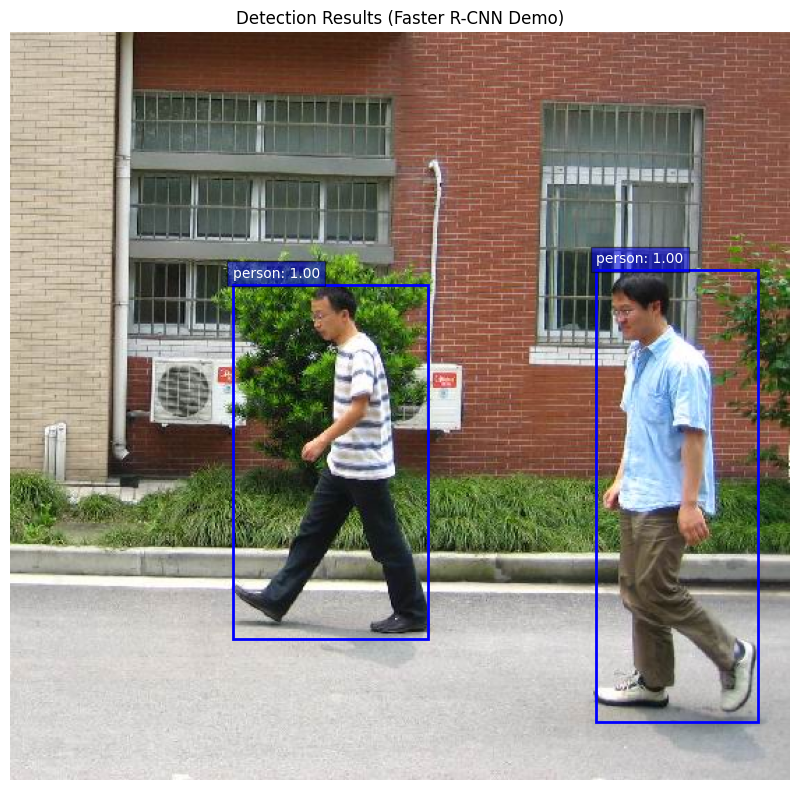


Detection Summary:
Total detections: 2
  1. person: 1.000
  2. person: 1.000


In [17]:
import torch
import torchvision
import torchvision.transforms as transforms
import torchvision.ops as ops
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Tentukan device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Daftar Kelas COCO (91 Kelas standar)
COCO_CLASSES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

def fast_rcnn_inference(image_path, model, threshold=0.7, nms_threshold=0.3):
    """
    Fast R-CNN inference pipeline (Theoretical Implementation)
    Requires: Custom 'FastRCNN' class instance & 'generate_region_proposals' function.

    Args:
        image_path: Path to input image
        model: Custom Fast R-CNN model instance
        threshold: Confidence threshold
        nms_threshold: NMS IoU threshold

    Returns:
        boxes, labels, scores: Detection results
    """
    # Step 1: Load and preprocess image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Image not found at {image_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    # Step 2: Generate region proposals (selective search)
    # Pastikan fungsi generate_region_proposals dari sesi sebelumnya sudah didefinisikan
    print("Generating region proposals (Selective Search)...")
    try:
        proposals, _ = generate_region_proposals(image_path, scale=500)
    except NameError:
        print("Error: Fungsi 'generate_region_proposals' belum ada. Melewati langkah ini.")
        return [], [], [], img_rgb

    # Convert proposals to boxes format [x1, y1, x2, y2]
    boxes = []
    for prop in proposals[:1000]:  # Limit to 1000 proposals for speed
        x, y, w, h = prop['rect']
        boxes.append([x, y, x+w, y+h])

    # Format input untuk Custom Model (sesuai definisi class FastRCNN sebelumnya)
    # Custom Model sebelumnya menerima List of Tensors
    boxes_tensor = torch.FloatTensor(boxes).to(device)
    proposals_list = [boxes_tensor] # Bungkus dalam list karena batch=1

    # Step 3: Forward pass
    print("Running Fast R-CNN inference...")
    model.eval()
    with torch.no_grad():
        # Memanggil model custom (pastikan model menerima argumen ini)
        cls_scores, bbox_deltas = model(img_tensor, proposals_list)

    # Step 4: Post-processing
    # Apply softmax to get probabilities
    probs = torch.softmax(cls_scores, dim=1)

    # Get max class and score for each box
    scores, labels = torch.max(probs, dim=1)

    # Filter background class (0) and low confidence
    keep = (labels > 0) & (scores > threshold)

    boxes_filtered = boxes_tensor[keep] # Tetap di GPU/Tensor untuk NMS
    labels_filtered = labels[keep]
    scores_filtered = scores[keep]

    # Apply NMS (Non-Maximum Suppression)
    # Menghapus kotak yang tumpang tindih untuk objek yang sama
    if len(boxes_filtered) > 0:
        keep_nms = ops.nms(
            boxes_filtered,
            scores_filtered,
            nms_threshold
        )
        # Final result conversion to numpy
        boxes_filtered = boxes_filtered[keep_nms].cpu().numpy()
        labels_filtered = labels_filtered[keep_nms].cpu().numpy()
        scores_filtered = scores_filtered[keep_nms].cpu().numpy()
    else:
        boxes_filtered = np.array([])
        labels_filtered = np.array([])
        scores_filtered = np.array([])

    print(f"Found {len(boxes_filtered)} objects after NMS")

    return boxes_filtered, labels_filtered, scores_filtered, img_rgb

# --- DEMO SECTION (Menggunakan Pre-trained Faster R-CNN) ---
# Note: Kita menggunakan Faster R-CNN pre-trained karena melatih Fast R-CNN
# dari nol (Custom Model) membutuhkan dataset label bounding box yang besar.

print("\n" + "="*50)
print("Note: Fast R-CNN training requires labeled dataset.")
print("For demonstration, we'll use pre-trained Faster R-CNN.")
print("="*50)

# Use pre-trained Faster R-CNN for demonstration
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model_pretrained = fasterrcnn_resnet50_fpn(weights=weights)
model_pretrained.to(device)
model_pretrained.eval()

def fast_rcnn_demo(image_path, threshold=0.7):
    """
    Demonstrate Object Detection using pre-trained model
    """
    # Load image
    img = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([transforms.ToTensor()])
    img_tensor = transform(img).to(device)

    # Inference
    with torch.no_grad():
        predictions = model_pretrained([img_tensor])

    # Extract results
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Filter by threshold
    keep = scores > threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    return boxes, labels, scores, np.array(img)

# --- Execution Block ---

image_path = 'PennFudanPed/PNGImages/FudanPed00001.png' # Ganti sesuai path Anda

try:
    # Run inference
    boxes, labels, scores, img = fast_rcnn_demo(
        image_path,
        threshold=0.7
    )

    # Visualize
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)

    for box, label, score in zip(boxes, labels, scores):
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1

        rect = patches.Rectangle(
            (x1, y1), w, h,
            linewidth=2,
            edgecolor='blue',
            facecolor='none'
        )
        ax.add_patch(rect)

        # Handle class name safely
        if label < len(COCO_CLASSES):
            class_name = COCO_CLASSES[label]
        else:
            class_name = f'class_{label}'

        ax.text(
            x1, y1-5,
            f'{class_name}: {score:.2f}',
            bbox=dict(facecolor='blue', alpha=0.5),
            fontsize=10, color='white'
        )

    ax.set_title('Detection Results (Faster R-CNN Demo)')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('fast_rcnn_results.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\nDetection Summary:")
    print(f"Total detections: {len(boxes)}")

    for i, (label, score) in enumerate(zip(labels, scores)):
        if label < len(COCO_CLASSES):
            class_name = COCO_CLASSES[label]
        else:
            class_name = f'class_{label}'
        print(f"  {i+1}. {class_name}: {score:.3f}")

except FileNotFoundError:
    print(f"Error: Gambar tidak ditemukan di {image_path}")
except Exception as e:
    print(f"Terjadi kesalahan: {e}")

### Langkah 2.4: Perbandingan R-CNN vs Fast R-CNN

In [18]:
import time
import os

def compare_rcnn_vs_fast_rcnn(image_path):
    """
    Compare inference time between R-CNN and Fast R-CNN
    """
    print("=" * 60)
    print(f"Comparing R-CNN vs Fast R-CNN on image: {image_path}")
    print("=" * 60)

    # Cek apakah file gambar ada
    if not os.path.exists(image_path):
        print(f"Error: File gambar tidak ditemukan di {image_path}")
        return

    # --- 1. R-CNN (Simplified Version) ---
    # Ini akan lambat karena menjalankan Selective Search + Ekstraksi Fitur berulang
    print("\n[R-CNN Classic / Simplified]")
    print("Note: Proses ini mungkin memakan waktu lama (bisa >10 detik)...")

    start_time = time.time()

    try:
        # Pastikan fungsi ini sudah didefinisikan dari kode sebelumnya
        boxes_rcnn, labels_rcnn, scores_rcnn, _ = rcnn_inference_simplified(
            image_path, threshold=0.7
        )
        rcnn_time = time.time() - start_time
        print(f"Inference time: {rcnn_time:.2f} seconds")
        print(f"Detections:     {len(boxes_rcnn)}")
    except NameError:
        print("Error: Fungsi 'rcnn_inference_simplified' belum didefinisikan.")
        return

    # --- 2. Fast R-CNN (Demo using Pre-trained) ---
    # Ini akan sangat cepat karena menggunakan Shared Feature Map
    print("\n[Fast R-CNN / Faster R-CNN Demo]")
    start_time = time.time()

    try:
        # Pastikan fungsi ini sudah didefinisikan dari kode sebelumnya
        boxes_fast, labels_fast, scores_fast, _ = fast_rcnn_demo(
            image_path, threshold=0.7
        )
        fast_rcnn_time = time.time() - start_time
        print(f"Inference time: {fast_rcnn_time:.2f} seconds")
        print(f"Detections:     {len(boxes_fast)}")
    except NameError:
        print("Error: Fungsi 'fast_rcnn_demo' belum didefinisikan.")
        return

    # --- 3. Summary ---
    print("\n" + "=" * 60)
    print("SUMMARY")
    print("=" * 60)
    print(f"R-CNN time:      {rcnn_time:.2f}s")
    print(f"Fast R-CNN time: {fast_rcnn_time:.2f}s")

    # Menghindari pembagian dengan nol jika sangat cepat
    if fast_rcnn_time > 0:
        speedup = rcnn_time / fast_rcnn_time
        # Perbaikan: Menggabungkan baris yang terputus di kode asli
        print(f"Speedup:         {speedup:.2f}x faster")
    else:
        print("Speedup:         Infinite (Fast R-CNN too fast to measure)")

    print("=" * 60)

# --- Eksekusi ---

# Ganti dengan path gambar yang valid di komputer Anda
image_path_test = 'PennFudanPed/PNGImages/FudanPed00001.png'

# Pastikan fungsi dependensi sudah ada sebelum menjalankan
if 'rcnn_inference_simplified' in locals() and 'fast_rcnn_demo' in locals():
    compare_rcnn_vs_fast_rcnn(image_path_test)
else:
    print("PERINGATAN: Harap jalankan kode dari pertanyaan sebelumnya")
    print("(rcnn_inference_simplified & fast_rcnn_demo) terlebih dahulu.")

Comparing R-CNN vs Fast R-CNN on image: PennFudanPed/PNGImages/FudanPed00001.png

[R-CNN Classic / Simplified]
Note: Proses ini mungkin memakan waktu lama (bisa >10 detik)...
Step 1: Generating region proposals...
Generated 342 proposals
Step 2: Extracting features from regions...
Using device: cuda
Extracted features from 342 regions
Step 3: Classifying regions (using Faster R-CNN)...
Step 4: Found 2 objects above threshold 0.7
Inference time: 9.36 seconds
Detections:     2

[Fast R-CNN / Faster R-CNN Demo]
Inference time: 0.11 seconds
Detections:     2

SUMMARY
R-CNN time:      9.36s
Fast R-CNN time: 0.11s
Speedup:         83.45x faster


## Praktikum 3: Implementasi Faster R-CNN
### Langkah 3.1: Load Pre-trained Faster R-CNN

In [19]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights

# Tentukan device (GPU/CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load pre-trained Faster R-CNN
# Weights DEFAULT menggunakan bobot terbaik yang tersedia (biasanya IMAGENET1K_V1)
weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
model_faster_rcnn = fasterrcnn_resnet50_fpn(weights=weights)

# Pindahkan model ke device dan set ke mode evaluasi
model_faster_rcnn.to(device)
model_faster_rcnn.eval()

print("-" * 50)
print("Faster R-CNN Model Loaded Successfully")
print(f"Model trained on: COCO dataset (91 Classes including background)")
print(f"Backbone: ResNet-50 with FPN (Feature Pyramid Network)")
print("-" * 50)

# COCO class names
# List ini harus urut sesuai ID yang dikeluarkan oleh model (0-90)
# 'N/A' digunakan karena beberapa ID dilewati dalam dataset COCO asli (paper 2014)
COCO_INSTANCE_CATEGORIES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
    'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
    'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket',
    'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl',
    'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
    'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table',
    'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book',
    'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

# Verifikasi jumlah kelas
print(f"Total Class Definitions: {len(COCO_INSTANCE_CATEGORIES)}")

# --- Test Sederhana (Dummy Pass) ---
# Untuk memastikan model tidak crash
try:
    print("\nRunning dummy test...")
    # Buat gambar dummy [Channel, Height, Width] -> [Batch, C, H, W]
    dummy_img = torch.rand(1, 3, 400, 400).to(device)

    with torch.no_grad():
        predictions = model_faster_rcnn(dummy_img)

    print("Model Inference Test: PASSED")
    print(f"Output keys: {predictions[0].keys()}") # boxes, labels, scores
except Exception as e:
    print(f"Model Inference Test: FAILED -> {e}")

Using device: cuda
--------------------------------------------------
Faster R-CNN Model Loaded Successfully
Model trained on: COCO dataset (91 Classes including background)
Backbone: ResNet-50 with FPN (Feature Pyramid Network)
--------------------------------------------------
Total Class Definitions: 91

Running dummy test...
Model Inference Test: PASSED
Output keys: dict_keys(['boxes', 'labels', 'scores'])


### Langkah 3.2: Implementasi Inference Function

Inference time: 0.136 seconds
Detected 11 objects above threshold 0.7


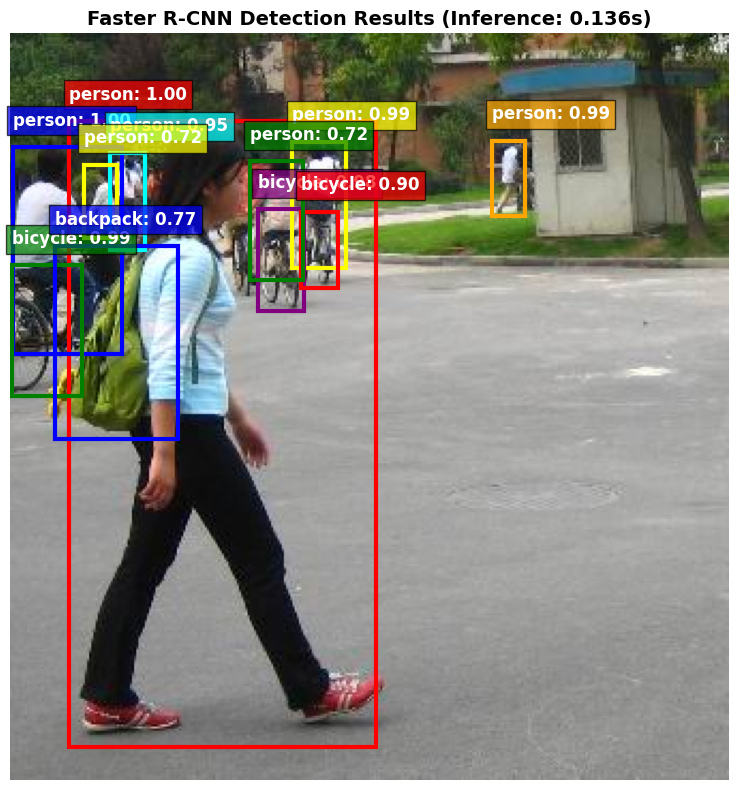


Detection Details:
1. person          | Score: 0.999 | Box: [27, 41, 171, 333]
2. person          | Score: 0.998 | Box: [1, 53, 52, 149]
3. bicycle         | Score: 0.995 | Box: [0, 108, 33, 169]
4. person          | Score: 0.990 | Box: [131, 50, 156, 109]
5. person          | Score: 0.990 | Box: [225, 50, 240, 85]
6. bicycle         | Score: 0.975 | Box: [115, 82, 137, 129]
7. person          | Score: 0.952 | Box: [46, 55, 63, 101]
8. bicycle         | Score: 0.898 | Box: [136, 83, 153, 118]
9. backpack        | Score: 0.771 | Box: [20, 99, 78, 189]
10. person          | Score: 0.718 | Box: [112, 59, 136, 115]
11. person          | Score: 0.717 | Box: [34, 61, 50, 95]


In [20]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import time
import os

# Tentukan device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def faster_rcnn_inference(image_path, model, threshold=0.5):
    """
    Faster R-CNN inference pipeline

    Args:
        image_path: Path to input image
        model: Faster R-CNN model
        threshold: Confidence threshold

    Returns:
        boxes, labels, scores, image, inference_time
    """
    # Load image
    # Check file existence
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"File gambar tidak ditemukan: {image_path}")

    img = Image.open(image_path).convert('RGB')

    # Preprocessing standar (ToTensor otomatis mengubah range 0-255 ke 0-1)
    img_tensor = transforms.ToTensor()(img).to(device)

    # Inference
    model.eval()
    with torch.no_grad():
        start_time = time.time()
        # Model membutuhkan input berupa list of tensors [tensor1, tensor2, ...]
        predictions = model([img_tensor])
        inference_time = time.time() - start_time

    # Extract results (ambil elemen pertama [0] karena batch size = 1)
    boxes = predictions[0]['boxes'].cpu().numpy()
    labels = predictions[0]['labels'].cpu().numpy()
    scores = predictions[0]['scores'].cpu().numpy()

    # Filter by threshold
    keep = scores > threshold
    boxes = boxes[keep]
    labels = labels[keep]
    scores = scores[keep]

    print(f"Inference time: {inference_time:.3f} seconds")
    print(f"Detected {len(boxes)} objects above threshold {threshold}")

    return boxes, labels, scores, np.array(img), inference_time

# --- Eksekusi dan Visualisasi ---

image_path_test = 'PennFudanPed/PNGImages/FudanPed00015.png'

# Pengecekan Dependensi (Model & Kategori Kelas)
if 'model_faster_rcnn' not in locals():
    print("PERINGATAN: 'model_faster_rcnn' belum dimuat. Harap jalankan kode sebelumnya.")
    # Untuk mencegah crash, kita hentikan eksekusi di sini jika model tidak ada
else:
    try:
        # Run inference
        boxes, labels, scores, img, inf_time = faster_rcnn_inference(
            image_path_test,
            model_faster_rcnn,
            threshold=0.7
        )

        # Visualize results
        fig, ax = plt.subplots(1, figsize=(12, 8))
        ax.imshow(img)

        # Warna-warni untuk kotak berbeda agar visualisasi menarik
        colors = ['red', 'blue', 'green', 'yellow', 'orange', 'purple', 'cyan']

        for i, (box, label, score) in enumerate(zip(boxes, labels, scores)):
            # Koordinat Faster R-CNN biasanya [x1, y1, x2, y2]
            x1, y1, x2, y2 = box

            # Matplotlib Rectangle butuh format (x, y), width, height
            w, h = x2 - x1, y2 - y1

            # Pilih warna (cycling)
            color = colors[i % len(colors)]

            # Gambar Kotak
            rect = patches.Rectangle(
                (x1, y1), w, h,
                linewidth=3,
                edgecolor=color,
                facecolor='none'
            )
            ax.add_patch(rect)

            # Ambil nama kelas
            if 'COCO_INSTANCE_CATEGORIES' in locals() and label < len(COCO_INSTANCE_CATEGORIES):
                class_name = COCO_INSTANCE_CATEGORIES[label]
            else:
                class_name = f"Class {label}"

            # Tambahkan Teks Label dengan Background Box
            ax.text(
                x1, y1-10,
                f'{class_name}: {score:.2f}',
                bbox=dict(facecolor=color, alpha=0.7),
                fontsize=12, color='white', weight='bold'
            )

        ax.set_title(f'Faster R-CNN Detection Results (Inference: {inf_time:.3f}s)', fontsize=14, weight='bold')
        plt.axis('off')
        plt.tight_layout()
        plt.savefig('faster_rcnn_results.png', dpi=150, bbox_inches='tight')
        plt.show()

        # Print detection details
        print(f"\nDetection Details:")
        print("=" * 60)

        for i, (box, label, score) in enumerate(zip(boxes, labels, scores)):
            if 'COCO_INSTANCE_CATEGORIES' in locals() and label < len(COCO_INSTANCE_CATEGORIES):
                class_name = COCO_INSTANCE_CATEGORIES[label]
            else:
                class_name = f"Class {label}"

            x1, y1, x2, y2 = box

            # Perbaikan: Menyatukan string f-string yang terputus
            print(f"{i+1}. {class_name:15s} | Score: {score:.3f} | Box: [{x1:.0f}, {y1:.0f}, {x2:.0f}, {y2:.0f}]")

        print("=" * 60)

    except FileNotFoundError:
        print(f"Error: File gambar tidak ditemukan di {image_path_test}")
    except Exception as e:
        print(f"Terjadi kesalahan: {e}")

### Langkah 3.3: Batch Inference untuk Multiple Images

Starting batch inference on 5 images...
[1/5] FudanPed00001.png | Time: 0.206s | Detections: 2
[2/5] FudanPed00005.png | Time: 0.186s | Detections: 4
[3/5] FudanPed00010.png | Time: 0.151s | Detections: 5
[4/5] FudanPed00015.png | Time: 0.144s | Detections: 11
[5/5] FudanPed00020.png | Time: 0.259s | Detections: 7

Batch Inference Summary
Total images:     5
Total time:       0.946s
Average time:     0.189s per image
Throughput:       5.28 FPS


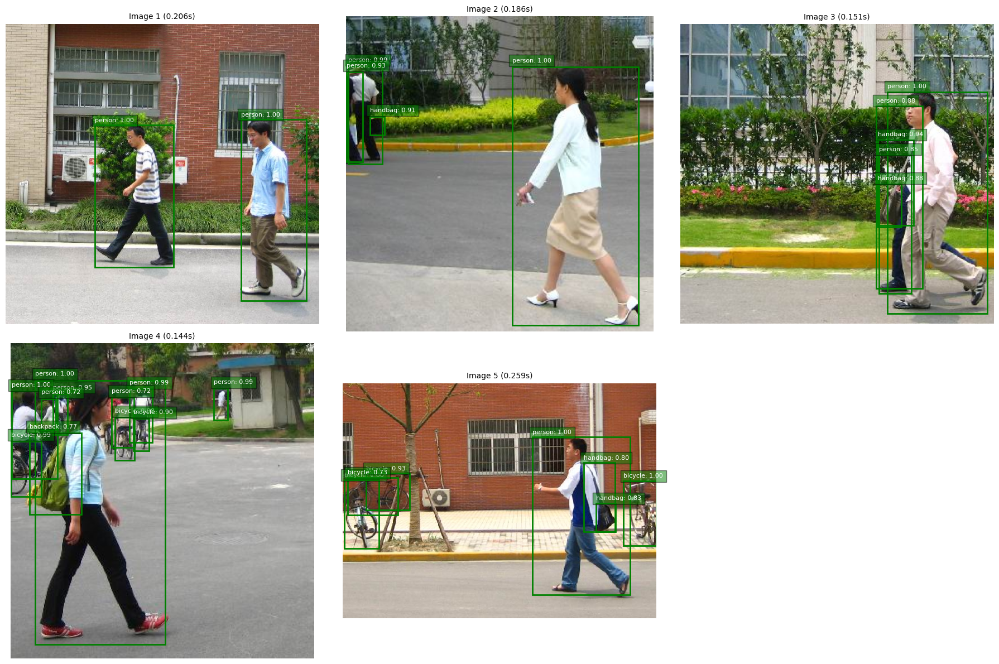

In [21]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import time
import os

# Tentukan device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def faster_rcnn_batch_inference(image_paths, model, threshold=0.5):
    """
    Batch inference for multiple images

    Args:
        image_paths: List of image paths
        model: Faster R-CNN model
        threshold: Confidence threshold

    Returns:
        results: List of detection results for each image
    """
    results = []
    total_time = 0

    # Pindahkan model ke device dan set mode evaluasi
    model.to(device)
    model.eval()

    print(f"Starting batch inference on {len(image_paths)} images...")

    for i, img_path in enumerate(image_paths):
        # Cek apakah file ada
        if not os.path.exists(img_path):
            print(f"Warning: File not found {img_path}, skipping.")
            continue

        # Load image
        try:
            img = Image.open(img_path).convert('RGB')
            # Transformasi standar
            img_tensor = transforms.ToTensor()(img).to(device)

            # Inference
            with torch.no_grad():
                start_time = time.time()
                # Model butuh list of tensors
                predictions = model([img_tensor])
                inference_time = time.time() - start_time
                total_time += inference_time

            # Extract results (batch size selalu 1 di loop ini)
            boxes = predictions[0]['boxes'].cpu().numpy()
            labels = predictions[0]['labels'].cpu().numpy()
            scores = predictions[0]['scores'].cpu().numpy()

            # Filter by threshold
            keep = scores > threshold
            boxes = boxes[keep]
            labels = labels[keep]
            scores = scores[keep]

            # Perbaikan: Menyatukan string print yang terputus
            print(f"[{i+1}/{len(image_paths)}] {os.path.basename(img_path)} | Time: {inference_time:.3f}s | Detections: {len(boxes)}")

            results.append({
                'image_path': img_path,
                'boxes': boxes,
                'labels': labels,
                'scores': scores,
                'image': np.array(img),
                'inference_time': inference_time
            })
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    # Hitung statistik waktu
    if len(results) > 0:
        avg_time = total_time / len(results)
        fps = 1.0 / avg_time

        print(f"\n{'='*60}")
        print(f"Batch Inference Summary")
        print(f"{'='*60}")
        print(f"Total images:     {len(results)}")
        print(f"Total time:       {total_time:.3f}s")
        print(f"Average time:     {avg_time:.3f}s per image")
        print(f"Throughput:       {fps:.2f} FPS")
        print(f"{'='*60}")
    else:
        print("No images were processed successfully.")

    return results

# --- Eksekusi dan Visualisasi ---

# Daftar gambar sampel
sample_images = [
    'PennFudanPed/PNGImages/FudanPed00001.png',
    'PennFudanPed/PNGImages/FudanPed00005.png',
    'PennFudanPed/PNGImages/FudanPed00010.png',
    'PennFudanPed/PNGImages/FudanPed00015.png',
    'PennFudanPed/PNGImages/FudanPed00020.png',
]

# Cek Dependensi Model
if 'model_faster_rcnn' in locals():
    # Run batch inference
    batch_results = faster_rcnn_batch_inference(
        sample_images,
        model_faster_rcnn,
        threshold=0.7
    )

    if batch_results:
        # Visualize all results
        # Grid 2 baris x 3 kolom (cukup untuk 5-6 gambar)
        rows, cols = 2, 3
        fig, axes = plt.subplots(rows, cols, figsize=(18, 12))
        axes = axes.flatten()

        for idx, result in enumerate(batch_results):
            if idx >= rows * cols:
                break

            ax = axes[idx]
            img = result['image']
            boxes = result['boxes']
            labels = result['labels']
            scores = result['scores']

            ax.imshow(img)

            # Gambar kotak bounding box
            for box, label, score in zip(boxes, labels, scores):
                x1, y1, x2, y2 = box
                w, h = x2 - x1, y2 - y1

                rect = patches.Rectangle(
                    (x1, y1), w, h,
                    linewidth=2,
                    edgecolor='green',
                    facecolor='none'
                )
                ax.add_patch(rect)

                # Ambil nama kelas
                if 'COCO_INSTANCE_CATEGORIES' in locals() and label < len(COCO_INSTANCE_CATEGORIES):
                    class_name = COCO_INSTANCE_CATEGORIES[label]
                else:
                    class_name = f"Class {label}"

                ax.text(
                    x1, y1-5,
                    f'{class_name}: {score:.2f}',
                    bbox=dict(facecolor='green', alpha=0.5),
                    fontsize=8, color='white'
                )

            # Set judul subplot
            ax.set_title(f"Image {idx+1} ({result['inference_time']:.3f}s)", fontsize=10)
            ax.axis('off')

        # Sembunyikan subplot kosong (sisa dari grid 2x3)
        for i in range(len(batch_results), rows * cols):
            axes[i].axis('off')

        plt.tight_layout()
        plt.savefig('faster_rcnn_batch_results.png', dpi=150, bbox_inches='tight')
        plt.show()
else:
    print("Error: 'model_faster_rcnn' belum didefinisikan. Jalankan kode inisialisasi model terlebih dahulu.")

### Langkah 3.4: Fine-tuning Faster R-CNN pada Custom Dataset

In [23]:
import os
import numpy as np
import torch
import torch.utils.data as data
from PIL import Image

class PennFudanDataset(data.Dataset):
    """
    Custom dataset for Penn-Fudan Pedestrian Detection
    Structure:
    - root/
      - PNGImages/ (Images)
      - PedMasks/  (Segmentation Masks)
    """
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms

        # Pastikan folder ada sebelum lanjut
        if not os.path.exists(root):
            raise FileNotFoundError(f"Dataset tidak ditemukan di path: {root}")

        # Load all image files, sorting them to ensure alignment
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        # Load image and mask
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])

        # Note: Image harus dikonversi ke RGB karena format asli mungkin RGBA
        img = Image.open(img_path).convert("RGB")

        # Mask jangan dikonversi ke RGB, karena setiap warna merepresentasikan ID instance
        mask = Image.open(mask_path)

        # Convert to numpy array
        mask = np.array(mask)

        # Instances are encoded as different colors
        # Background = 0, Orang ke-1 = 1, Orang ke-2 = 2, dst.
        obj_ids = np.unique(mask)

        # Remove background (id 0)
        obj_ids = obj_ids[1:]

        # Split mask into binary masks (True/False pixel map per objek)
        # Shape menjadi: [num_instances, H, W]
        masks = mask == obj_ids[:, None, None]

        # Get bounding boxes for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        # Convert everything to Torch Tensors
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # Only one class: person (Label selalu 1 karena background itu 0)
        labels = torch.ones((num_objs,), dtype=torch.int64)

        masks = torch.as_tensor(masks, dtype=torch.uint8)
        image_id = torch.tensor([idx])

        # Calculate area (needed for evaluation metrics like COCO)
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])

        # iscrowd=0 means standard object (not a group of objects)
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        # Bungkus semua info target dalam dictionary
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

# --- Test Dataset ---

# Ganti path ini sesuai lokasi dataset Anda
dataset_path = 'PennFudanPed'

try:
    # Create dataset
    # Kita set transforms=None dulu untuk test loading raw data
    dataset = PennFudanDataset(dataset_path, transforms=None)
    print(f"Dataset loaded successfully.")
    print(f"Dataset size: {len(dataset)} images")

    # Test mengambil 1 sampel (index 0)
    img, target = dataset[0]

    print("-" * 40)
    print("Sample Data (Index 0):")
    print("-" * 40)
    print(f"Image Type:       {type(img)}")
    print(f"Image Size:       {img.size}")
    print(f"Target Keys:      {list(target.keys())}")

    # Cek detail objek
    num_objects = len(target['boxes'])
    print(f"Number of objects: {num_objects}")

    print(f"Boxes Tensor:     {target['boxes'].shape} (Format: N, 4)")
    print(f"Labels Tensor:    {target['labels']} (1 = Person)")
    print(f"Masks Tensor:     {target['masks'].shape} (Format: N, H, W)")

    # Print koordinat kotak pertama
    if num_objects > 0:
        print(f"First Box Coord:  {target['boxes'][0].numpy()}")

except FileNotFoundError as e:
    print(f"Error: {e}")
    print("Pastikan Anda sudah mendownload dataset PennFudanPed dan mengekstraknya.")
except Exception as e:
    print(f"Terjadi kesalahan: {e}")

Dataset loaded successfully.
Dataset size: 170 images
----------------------------------------
Sample Data (Index 0):
----------------------------------------
Image Type:       <class 'PIL.Image.Image'>
Image Size:       (559, 536)
Target Keys:      ['boxes', 'labels', 'masks', 'image_id', 'area', 'iscrowd']
Number of objects: 2
Boxes Tensor:     torch.Size([2, 4]) (Format: N, 4)
Labels Tensor:    tensor([1, 1]) (1 = Person)
Masks Tensor:     torch.Size([2, 536, 559]) (Format: N, H, W)
First Box Coord:  [159. 181. 301. 430.]


### Langkah 3.5: Training Loop untuk Fine-tuning

Dataset re-initialized with ToTensor transform.
Train size: 136
Validation size: 34

Starting training for 3 epochs on cuda...

Epoch 1/3
------------------------------------------------------------
Epoch [1], Step [5/68], Loss: 0.7136
Epoch [1], Step [10/68], Loss: 0.5584
Epoch [1], Step [15/68], Loss: 0.3293
Epoch [1], Step [20/68], Loss: 0.3271
Epoch [1], Step [25/68], Loss: 0.4325
Epoch [1], Step [30/68], Loss: 0.2331
Epoch [1], Step [35/68], Loss: 0.1568
Epoch [1], Step [40/68], Loss: 0.1344
Epoch [1], Step [45/68], Loss: 0.1852
Epoch [1], Step [50/68], Loss: 0.3694
Epoch [1], Step [55/68], Loss: 0.1922
Epoch [1], Step [60/68], Loss: 0.1887
Epoch [1], Step [65/68], Loss: 0.1290
Epoch [1] Average Loss: 0.2647

Epoch 2/3
------------------------------------------------------------
Epoch [2], Step [5/68], Loss: 0.1534
Epoch [2], Step [10/68], Loss: 0.0723
Epoch [2], Step [15/68], Loss: 0.1676
Epoch [2], Step [20/68], Loss: 0.0384
Epoch [2], Step [25/68], Loss: 0.1820
Epoch [2], Step 

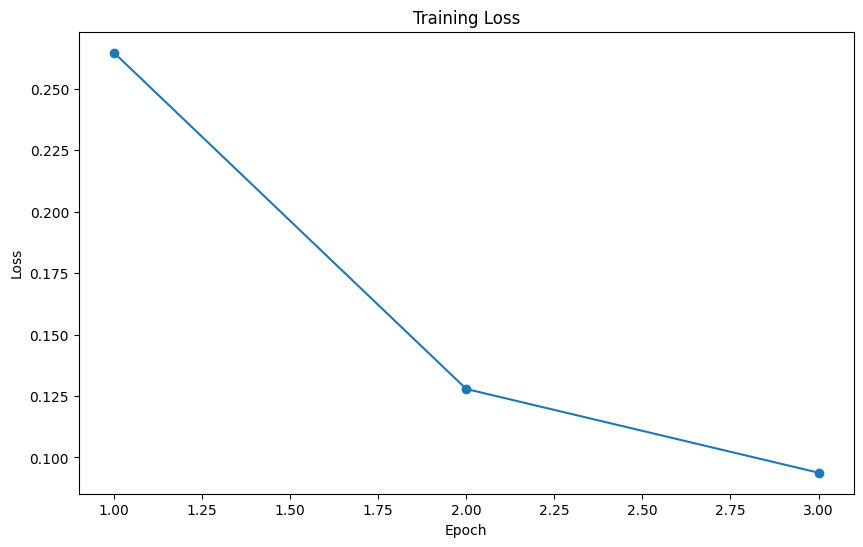

In [25]:
import torchvision.transforms.functional as F
import torchvision.transforms as T

# 1. Definisikan Class Transformasi Khusus
# Kita butuh ini karena standard transforms.ToTensor() hanya menerima 1 input (image),
# sedangkan dataset kita mengirim 2 input (image, target).
class ToTensor(object):
    def __call__(self, image, target):
        # Ubah PIL Image menjadi Tensor
        image = F.to_tensor(image)
        return image, target

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

# 2. Fungsi Utility untuk memanggil transform
def get_transform(train):
    transforms = []
    transforms.append(ToTensor())
    # Di sini bisa ditambahkan augmentasi lain (misal: RandomHorizontalFlip) jika perlu
    return Compose(transforms)

# 3. Re-Inisialisasi Dataset dengan Transform
# (PENTING: Kita load ulang dataset dengan transform yang baru dibuat)
dataset = PennFudanDataset('PennFudanPed', transforms=get_transform(train=True))

print("Dataset re-initialized with ToTensor transform.")

# 4. Split Dataset Ulang
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices)

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

# Gunakan Subset untuk membagi dataset (lebih aman daripada random_split untuk detection)
dataset_train = torch.utils.data.Subset(dataset, indices[:-val_size])
dataset_val = torch.utils.data.Subset(dataset, indices[-val_size:])

print(f"Train size: {len(dataset_train)}")
print(f"Validation size: {len(dataset_val)}")

# 5. Buat DataLoader Ulang
def collate_fn(batch):
    return tuple(zip(*batch))

train_loader = torch.utils.data.DataLoader(
    dataset_train,
    batch_size=2,
    shuffle=True,
    num_workers=0, # Set 0 untuk Windows
    collate_fn=collate_fn
)

val_loader = torch.utils.data.DataLoader(
    dataset_val,
    batch_size=2,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

# 6. Setup Model & Optimizer Ulang
model_finetuned = get_model_for_finetuning(num_classes=2)
model_finetuned.to(device)

params = [p for p in model_finetuned.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# 7. Jalankan Training Loop Kembali
num_epochs = 3
print(f"\nStarting training for {num_epochs} epochs on {device}...")
print(f"{'='*60}")

training_losses = []

try:
    for epoch in range(1, num_epochs + 1):
        print(f"\nEpoch {epoch}/{num_epochs}")
        print(f"{'-'*60}")

        # Panggil fungsi training
        avg_loss = train_one_epoch(model_finetuned, optimizer, train_loader, device, epoch)
        training_losses.append(avg_loss)

        # Update learning rate
        lr_scheduler.step()

    print(f"\n{'='*60}")
    print("Training completed successfully!")

    # Save model
    torch.save(model_finetuned.state_dict(), 'faster_rcnn_finetuned.pth')
    print("Model saved.")

    # Plot loss
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), training_losses, marker='o')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show()

except Exception as e:
    print(f"Masih ada error: {e}")
    # Print tipe data untuk debugging jika masih error
    img_sample, _ = dataset_train[0]
    print(f"Tipe data input sekarang: {type(img_sample)} (Harusnya torch.Tensor)")

### Langkah 3.6: Evaluasi Model Fine-tuned


--- Visualizing Results (Robust Version) ---


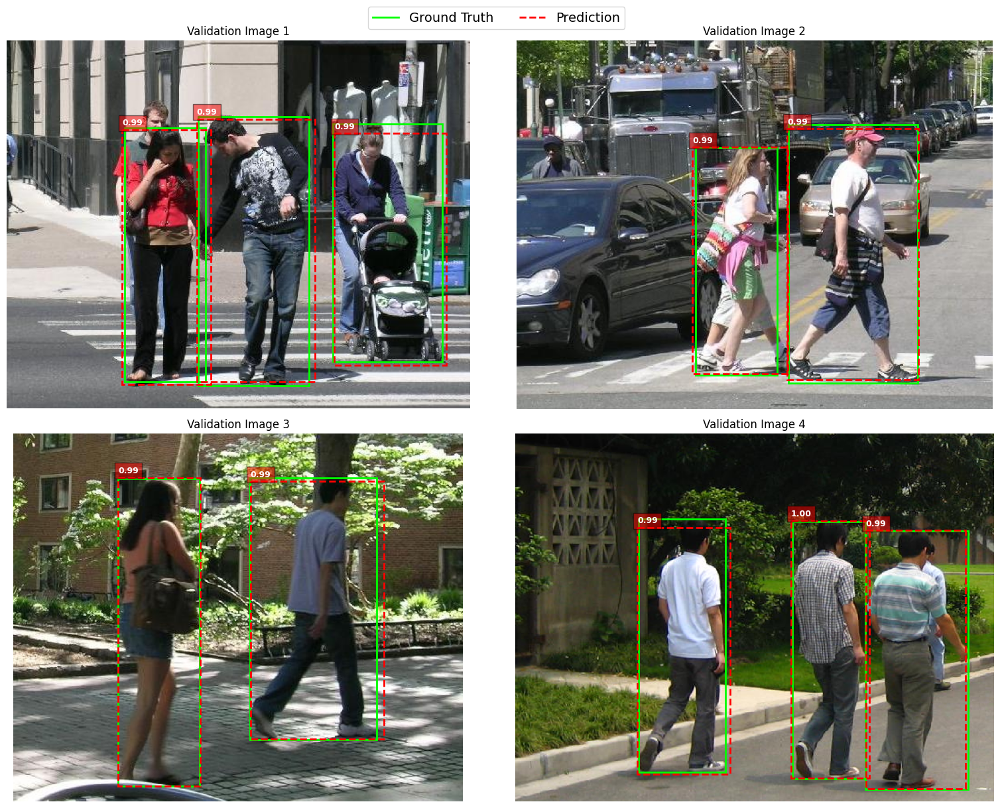


Visualisasi selesai tanpa error!


In [28]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import torchvision.transforms.functional as F
from PIL import Image

# --- KODE VISUALISASI YANG DIPERBAIKI ---

print("\n--- Visualizing Results (Robust Version) ---")

# Setup Canvas (2 baris x 2 kolom)
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# Loop untuk 4 gambar pertama
for idx in range(min(4, len(val_dataset))):
    # Ambil data dari dataset
    img, target = val_dataset[idx]

    # --- PERBAIKAN DI SINI (Handling PIL vs Tensor) ---
    if isinstance(img, torch.Tensor):
        # Jika sudah Tensor (bagus)
        img_tensor = img.to(device)
        # Untuk plotting: Tensor [C, H, W] -> Numpy [H, W, C]
        img_np = img.permute(1, 2, 0).cpu().numpy()
    else:
        # Jika masih PIL Image (penyebab error Anda sebelumnya)
        # Kita ubah manual jadi Tensor agar model bisa baca
        img_tensor = F.to_tensor(img).to(device)
        # Untuk plotting: PIL Image langsung jadi Numpy array
        img_np = np.array(img)

    # --- INFERENCE ---
    with torch.no_grad():
        # Model butuh input list [tensor]
        prediction = model_finetuned([img_tensor])[0]

    # --- PLOTTING ---
    ax = axes[idx]
    ax.imshow(img_np)

    # 1. Plot Ground Truth (HIJAU - Solid)
    gt_boxes = target['boxes'].cpu().numpy()
    for box in gt_boxes:
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        rect_gt = patches.Rectangle(
            (x1, y1), w, h,
            linewidth=2,
            edgecolor='lime',
            facecolor='none'
        )
        ax.add_patch(rect_gt)

    # 2. Plot Prediction (MERAH - Putus-putus)
    pred_boxes = prediction['boxes'].cpu().numpy()
    pred_scores = prediction['scores'].cpu().numpy()

    for box, score in zip(pred_boxes, pred_scores):
        if score > 0.5:  # Threshold visualisasi
            x1, y1, x2, y2 = box
            w, h = x2 - x1, y2 - y1

            rect_pred = patches.Rectangle(
                (x1, y1), w, h,
                linewidth=2,
                edgecolor='red',
                facecolor='none',
                linestyle='--'
            )
            ax.add_patch(rect_pred)

            ax.text(
                x1, y1-5,
                f'{score:.2f}',
                bbox=dict(facecolor='red', alpha=0.5),
                fontsize=9, color='white', weight='bold'
            )

    ax.set_title(f'Validation Image {idx+1}', fontsize=12)
    ax.axis('off')

# --- LEGEND ---
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='lime', lw=2, label='Ground Truth'),
    Line2D([0], [0], color='red', lw=2, linestyle='--', label='Prediction')
]
fig.legend(handles=legend_elements, loc='upper center', ncol=2, fontsize=14, bbox_to_anchor=(0.5, 1.02))

plt.tight_layout()
plt.savefig('finetuned_evaluation_fixed.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nVisualisasi selesai tanpa error!")